import data and filesettings notebook

In [1]:
%run fMRI_prestats0_general.ipynb



 The following subjects where excluded from further analysis due to false file numbers:  
 EPI:  [] T1:  []
The following parameters where not available from subjects' json files: 
 ['FED006_T1-DwellTime', 'FED006_T1-PhaseEncodingDirection', 'FED007_T1-PhaseEncodingDirection', 'FED008_T1-PhaseEncodingDirection', 'FED009_T1-PhaseEncodingDirection', 'FED010_T1-DwellTime', 'FED010_T1-PhaseEncodingDirection', 'FED011_T1-PhaseEncodingDirection', 'FED012_T1-PhaseEncodingDirection', 'FED013_T1-DwellTime', 'FED013_T1-PhaseEncodingDirection', 'FED014_T1-PhaseEncodingDirection', 'FED015_T1-PhaseEncodingDirection', 'FED016_T1-PhaseEncodingDirection', 'FED017_T1-DwellTime', 'FED017_T1-PhaseEncodingDirection', 'FED018_T1-DwellTime', 'FED018_T1-PhaseEncodingDirection', 'FED019_T1-DwellTime', 'FED019_T1-PhaseEncodingDirection', 'FED020_T1-PhaseEncodingDirection', 'FED021_T1-DwellTime', 'FED021_T1-PhaseEncodingDirection', 'FED022_T1-PhaseEncodingDirection', 'FED023_T1-PhaseEncodingDirection', 'FED02

In [2]:
# control results
key= random.sample(data.keys(), 1)
print(data[key[0]])
print(data["FED015"])

{'files': ['/fMRI/FED050/FMRI_0010_20151201165820.json', '/fMRI/FED050/FMRI_0010_20151201165820.nii', '/fMRI/FED050/FMRI_0010_20151201165820_distcor.nii', '/fMRI/FED050/FMRI_distcor_effect.nii', '/fMRI/FED050/GRE_FIELD_MAPPING_0006_20151201165820_e1.json', '/fMRI/FED050/GRE_FIELD_MAPPING_0006_20151201165820_e1.nii', '/fMRI/FED050/GRE_FIELD_MAPPING_0006_20151201165820_e2.json', '/fMRI/FED050/GRE_FIELD_MAPPING_0006_20151201165820_e2.nii', '/fMRI/FED050/GRE_FIELD_MAPPING_0007_20151201165820_e2_ph.json', '/fMRI/FED050/GRE_FIELD_MAPPING_0007_20151201165820_e2_ph.nii', '/fMRI/FED050/GRE_e1mag_bet_B.nii', '/fMRI/FED050/GRE_e1mag_bet_B_mask.nii', '/fMRI/FED050/T1_BETBf35.nii', '/fMRI/FED050/T1_BETBf35_mask.nii', '/fMRI/FED050/T1_BETBf35_overlay.nii', '/fMRI/FED050/T1_MPRAGE_0005_20151201165820.json', '/fMRI/FED050/T1_MPRAGE_0005_20151201165820.nii'], 'parameters': {'T1_ET': [0.00232], 'T1_RT': [2.3], 'T1_PES': [255], 'T1_PB': [200], 'EPI_ET': [0.025], 'EPI_RT': [1.8], 'EPI_ETL': [35], 'EPI_PES

# Processing

Motion correct / realign

In [8]:
# prepare the structural scans
# for usage in motion correction, normalisation etc.

structs=[i for sub in FEDs
       for i in data[sub]["files"]
       if re.match(r'.*(T1).*(?<=\d{14}).nii', i)]

# try different bets, starting with fsl_vbm parameters from custom bash script first
#fracs=["0."+str(i) for i in np.arange(20,80,5)]
# after visual inspection:
frac="0.35"

# perform brain extraction
for file in structs:
    bet=Node(fsl.BET(), name="bet")
    bet.inputs.in_file=file
    bet.inputs.out_file=f"{file.split('_', 1)[0]}_BETBf{str(frac[2:])}.nii"
    bet.inputs.outline= True
    bet.inputs.reduce_bias= True
    bet.inputs.frac= float(frac)
    bet.inputs.output_type="NIFTI"
    # run it
    res=bet.run()
    # print the results
    print(res.outputs)

200926-13:19:08,104 nipype.workflow INFO:
	 [Node] Setting-up "bet" in "/tmp/tmpygyufv9e/bet".
200926-13:19:08,113 nipype.workflow INFO:
	 [Node] Running "bet" ("nipype.interfaces.fsl.preprocess.BET"), a CommandLine Interface with command:
bet /fMRI/FED011/T1_MPRAGE_0005_20141119161708.nii /fMRI/FED011/T1_BETBf35.nii -f 0.35 -o -B
200926-13:26:51,404 nipype.workflow INFO:
	 [Node] Finished "bet".

inskull_mask_file = <undefined>
inskull_mesh_file = <undefined>
mask_file = /fMRI/FED011/T1_BETBf35_mask.nii
meshfile = <undefined>
out_file = /fMRI/FED011/T1_BETBf35.nii
outline_file = /fMRI/FED011/T1_BETBf35_overlay.nii
outskin_mask_file = <undefined>
outskin_mesh_file = <undefined>
outskull_mask_file = <undefined>
outskull_mesh_file = <undefined>
skull_file = <undefined>
skull_mask_file = <undefined>

200926-13:26:51,406 nipype.workflow INFO:
	 [Node] Setting-up "bet" in "/tmp/tmpylqjzu_a/bet".
200926-13:26:51,410 nipype.workflow INFO:
	 [Node] Running "bet" ("nipype.interfaces.fsl.preproc

63


/opt/miniconda-latest/envs/neuro/lib/python3.7/site-packages/nilearn/image/resampling.py:513: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
/opt/miniconda-latest/envs/neuro/lib/python3.7/site-packages/nilearn/image/resampling.py:513: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
/opt/miniconda-latest/envs/neuro/lib/python3.7/site-packages/nilearn/image/resampling.py:513: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
/opt/miniconda-latest/envs/neuro/lib/python3.7/site-packages/nilearn/image/resampling.py:513: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
/opt/miniconda-latest/envs/neuro/lib/python3.7/site-packages/nilearn/image/resampling.py:513: UserWarning: Casting data from int32 to float32
  warn

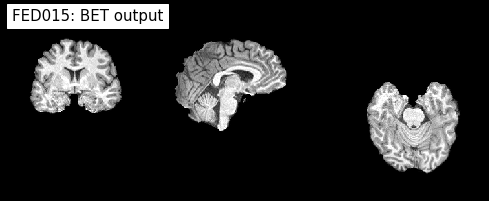

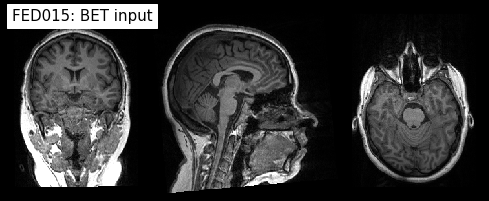

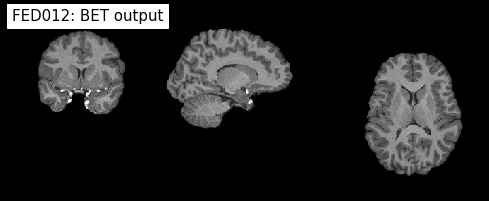

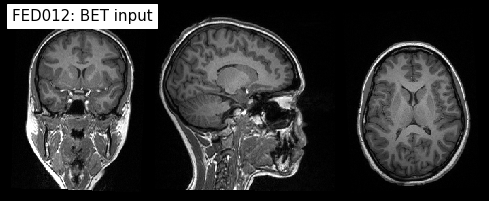

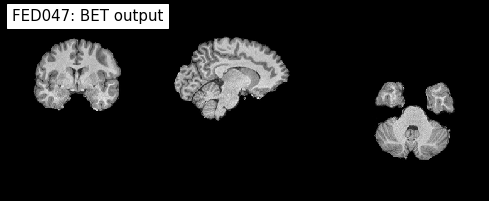

...

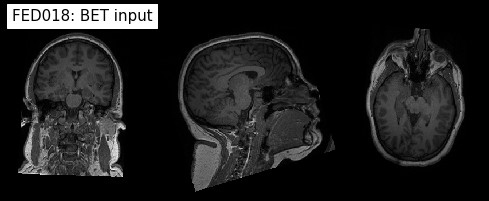

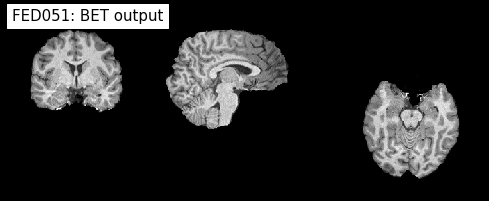

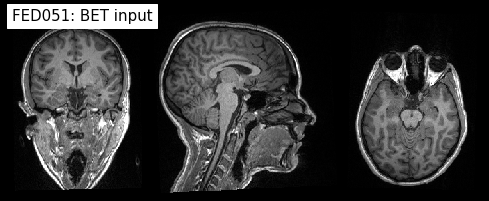

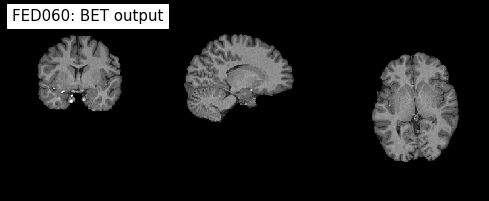

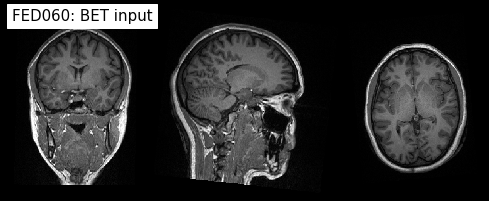

In [19]:
# update files
update_files()

# control number of brain-extracted files
BET_T1=[file for sub in FEDs
        for file in data[sub]["files"]
        if re.match(r'.*(T1_BET).*(?<!overlay)(?<!mask).nii', file)
       ]
print(len(BET_T1))

# plot before-after comparison of BET
for sub in FEDs:
    for file in data[sub]["files"]:
        if re.match(r'.*(T1).*(?<=\d{14}).nii', file):
            plot_anat(file, title=f'{sub}: BET input', cut_coords=(10,10,10), display_mode='ortho',
                      dim=-1, draw_cross=False, annotate=False);
        elif re.match(r'.*(T1_BET).*(?<!overlay)(?<!mask).nii', file):
            plot_anat(file, title=f'{sub}: BET output', cut_coords=(10,10,10), display_mode='ortho',
                      dim=-1, draw_cross=False, annotate=False);

Slicetime correction (?)

I will omit this step as advised by Poldrack, Nichols and Mumford "Handbook of fMRI data analysis"(2011)\
TR= 1800ms  > 2seconds, interleaved acquisition and likely smoothing\
event related analysis is relatively robust to slice-timing problems here.

Spatial normalisation

Spatial Smoothing

# QC